# Predicting two wheelers loan defaulters

### Data

TVS Credit Services Limited provides auto financing services. The Company offers bike, car, and heavy vehicles financing services. TVS Credit Services serves customers in worldwide.

Two wheeler loans are considered to be the simplest and the fastest way to buy your dream bike. It suits customers of all ages and they can purchase a two-wheeler by just paying a nominal down payment up front and the remaining amount in form of Equated Monthly Installments (EMIs).

As per the rising aspiration of youngsters, two-wheeler loans are more in demand to purchase superbikes, racer bikes, and cruiser bikes. However, previously the trend of taking two-wheeler loan has been in purchasing regular bikes and scooters.

Personal Loan product is an unsecured loan therefore it is vital to assess the risk of the customers by checking their credit worthiness. This must be done to prevent loan defaults.

The objective is to build a Risk model using the dataset which will assess the risk of a customer defaulting after cross-selling the Personal Loan.

In India the main variables to look up when assessing low credit score: previous or existing loans, delayed payment, credit card bills, missing payments, and multiple credit applications

119,528 observations 30 features 1 Target variable (1: Defaulters, 0:Non-Defaulters) Highly unbalanced: 2:98%

https://www.kaggle.com/sjleshrac/tvs-loan-default

### Industry Context

Global motorcycles sales dropped almost 30% in 1st half 2020 (Covid-19) Sales started bouncing back in the 3rd quarter of 2020 Two-wheelers targeted as best replace for public transport Post Covid-19 forecast predicts increase in sales 2020-25 Bikes less expensive than cars, less fuel, better mileage, easy to slide to traffic in peak hours

Defaults on two-wheelers estimated in 40% of total outstanding loans in 2007 Banks & financial institutions have tighten credit flow Financiers adopting stricter process to screen customer profiles Bulk of defaulters are in the 100cc & 110cc Predicted bad loans ratio to increase from 11.3% in Mar-20 t0 15.2% in Mar-21 in Reserve Bank and from 4.2 to 7.3% for private banks Dealers finding difficult to get banks to finance their inventory Focus on customer segmentation (particular when used for income generating activities) to mitigate potential risk There is no fixed score for availing a bike loan but institutions accept a score of 600+ or 750 upwards (CIBIL score range 300 to 900)

### Business question

Can a model assess the risk of defaulting on a personal loan?

What are the main features to look up?

### Loading packages

In [4]:
#Import libraries
import itertools
import pandas as pd
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

print('matplotlib: {}'.format(matplotlib.__version__)) 

plt.style.use('fivethirtyeight')

import seaborn as sns
sns.set(rc={'figure.figsize': (15, 10)})

from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from mlxtend.classifier import StackingClassifier

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import auc


## Avoid some version change warnings
import warnings
warnings.filterwarnings('ignore', message='numpy.dtype size changed')


# Cause plots to be displayed in the notebook:
%pylab inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

matplotlib: 3.4.2
Populating the interactive namespace from numpy and matplotlib


In [5]:
# Override default figure sizing:
pylab.rcParams['figure.figsize'] = (10, 6)
sns.set(color_codes = True)

### Load data (clean dataset)

In [6]:
# Read CSV
df2 = pd.read_csv("clean_data.csv", low_memory=False)

In [7]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5228 entries, 0 to 5227
Data columns (total 23 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   CustomerID                                          5228 non-null   int64  
 1   Customer_bounced_first_EMI                          5228 non-null   int64  
 2   No_times_bounced_12_months                          5228 non-null   int64  
 3   No_times_bounced_while_repaying_loan                5228 non-null   float64
 4   EMI                                                 5228 non-null   float64
 5   Loan_Amount                                         5228 non-null   float64
 6   Tenure                                              5228 non-null   float64
 7   No_advance_EMI_paid                                 5228 non-null   float64
 8   Interest_rate                                       5228 non-null   float64
 9

In [8]:
df2.head()

,CustomerID,Customer_bounced_first_EMI,No_times_bounced_12_months,No_times_bounced_while_repaying_loan,EMI,Loan_Amount,Tenure,No_advance_EMI_paid,Interest_rate,Customer_age_when_taken_loan,...,No_times_30_days_past_due_in_last_6_months,Target,Product_code_Two_wheeler_MO,Product_code_Two_wheeler_SC,Product_code_Two_wheeler_TL,Gender_MALE,Employment_type_PENS,Employment_type_SELF,Employment_type_STUDENT,Resident_type_customer_RENT
0,66470,0,0,0.000000,2690.000000,51427.000000,24.000000,0.000000,12.750000,28.000000,...,0,0,0,1,0,1,0,0,0,1
1,84206,0,0,0.000000,2314.000000,57850.000000,30.000000,2.000000,8.000000,35.000000,...,0,0,0,1,0,1,0,0,0,0
2,8318,0,0,0.000000,1911.000000,28655.000000,15.000000,0.000000,0.000000,28.000000,...,0,0,1,0,0,1,0,1,0,0
3,41311,0,0,0.000000,2518.000000,49900.000000,24.000000,0.000000,10.550000,46.000000,...,0,0,0,1,0,0,0,1,0,0
4,102951,0,2,0.953256,2313.243718,39765.521751,21.426101,0.638206,11.821535,35.799514,...,0,0,0,0,0,1,0,1,0,0


In [9]:
df2.set_index('CustomerID', inplace=True)

In [10]:
df2.head()

,Customer_bounced_first_EMI,No_times_bounced_12_months,No_times_bounced_while_repaying_loan,EMI,Loan_Amount,Tenure,No_advance_EMI_paid,Interest_rate,Customer_age_when_taken_loan,No_loans,...,No_times_30_days_past_due_in_last_6_months,Target,Product_code_Two_wheeler_MO,Product_code_Two_wheeler_SC,Product_code_Two_wheeler_TL,Gender_MALE,Employment_type_PENS,Employment_type_SELF,Employment_type_STUDENT,Resident_type_customer_RENT
CustomerID,,,,,,,,,,,,,,,,,,,,,
66470,0,0,0.000000,2690.000000,51427.000000,24.000000,0.000000,12.750000,28.000000,6,...,0,0,0,1,0,1,0,0,0,1
84206,0,0,0.000000,2314.000000,57850.000000,30.000000,2.000000,8.000000,35.000000,4,...,0,0,0,1,0,1,0,0,0,0
8318,0,0,0.000000,1911.000000,28655.000000,15.000000,0.000000,0.000000,28.000000,1,...,0,0,1,0,0,1,0,1,0,0
41311,0,0,0.000000,2518.000000,49900.000000,24.000000,0.000000,10.550000,46.000000,8,...,0,0,0,1,0,0,0,1,0,0
102951,0,2,0.953256,2313.243718,39765.521751,21.426101,0.638206,11.821535,35.799514,1,...,0,0,0,0,0,1,0,1,0,0


In [11]:
df2.shape

(5228, 22)

### EDA

In [12]:
pandas_profiling.ProfileReport(df2)

variables:   0%|          | 0/23 [00:00<?, ?it/s]

correlations:   0%|          | 0/6 [00:00<?, ?it/s]

interactions [continuous]:   0%|          | 0/169 [00:00<?, ?it/s]

table:   0%|          | 0/1 [00:00<?, ?it/s]

missing:   0%|          | 0/2 [00:00<?, ?it/s]

warnings:   0%|          | 0/3 [00:00<?, ?it/s]

package:   0%|          | 0/1 [00:00<?, ?it/s]

build report structure:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_bounced_first_EMI,5228.0,0.037873,0.190907,0.0,0.0000,0.000000,0.00,1.00
No_times_bounced_12_months,5228.0,0.683244,1.065077,0.0,0.0000,0.000000,1.00,12.00
No_times_bounced_while_repaying_loan,5228.0,0.953256,1.125977,0.0,0.0000,0.953256,1.00,19.00
EMI,5228.0,2313.243718,471.801805,960.0,2073.0000,2313.243718,2512.25,5271.00
Loan_Amount,5228.0,39765.521751,9205.919013,10000.0,33175.0000,39765.521751,45252.75,81400.00
Tenure,5228.0,21.426101,4.667622,7.0,18.0000,21.426101,24.00,36.00
No_advance_EMI_paid,5228.0,0.638206,0.841864,0.0,0.0000,0.638206,1.00,6.00
Interest_rate,5228.0,11.821535,3.221859,0.0,11.3875,11.821535,13.50,20.65
Customer_age_when_taken_loan,5228.0,35.799514,8.269717,19.0,30.0000,35.799514,40.00,62.00
No_loans,5228.0,3.498661,6.012947,0.0,1.0000,1.000000,4.00,97.00


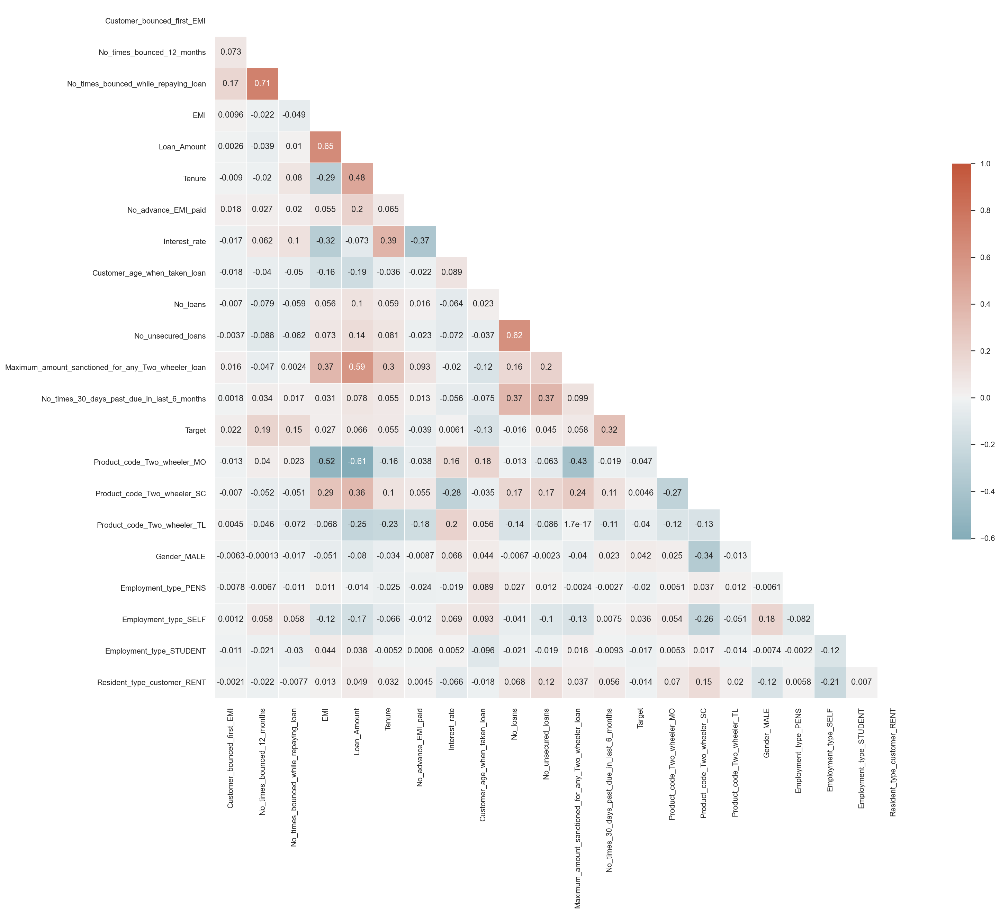

In [14]:
# Heatmap using seaborne to visualise the correlation between the different variables of the dataset. The heatmap is a correlation matrix.
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(df2.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20,20))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df2.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();

### Splitting the data

In [15]:
X = df2.drop('Target', axis=1)
y = df2[['Target']]

In [16]:
X.shape

(5228, 21)

In [17]:
y.shape

(5228, 1)

In [18]:
y.value_counts(normalize=True)

Target
1         0.5
0         0.5
dtype: float64

<AxesSubplot:xlabel='Target'>

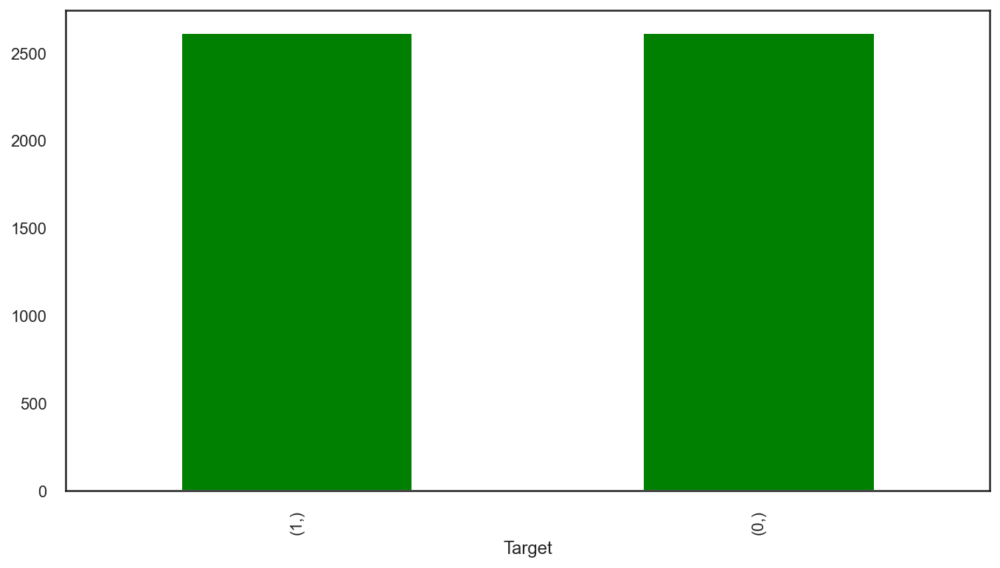

In [19]:
y.value_counts(normalize=False).plot(kind='bar', color='green')

In [29]:
# train is 80% of the entire data set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)

In [30]:
# Splitted data
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)

print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (4182, 21)
X_test shape is  (1046, 21)
y_train shape is  (4182, 1)
y_test shape is  (1046, 1)


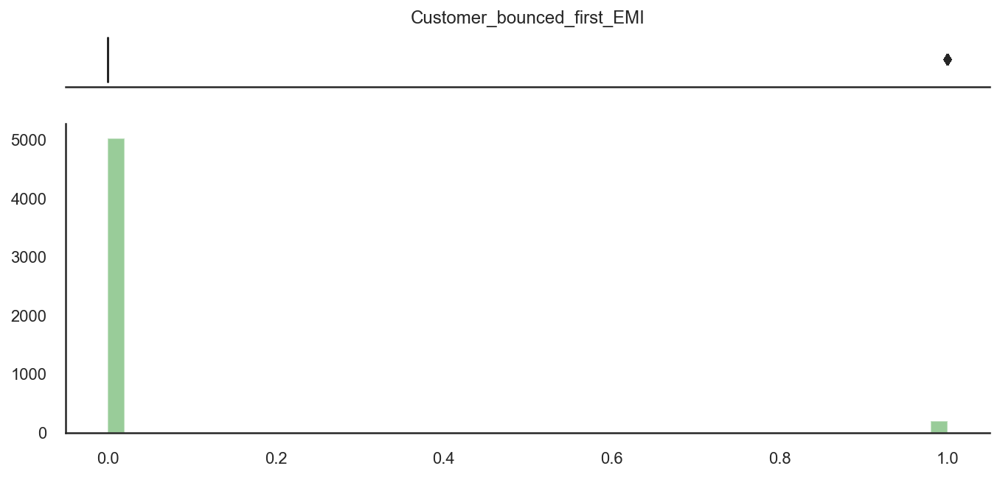

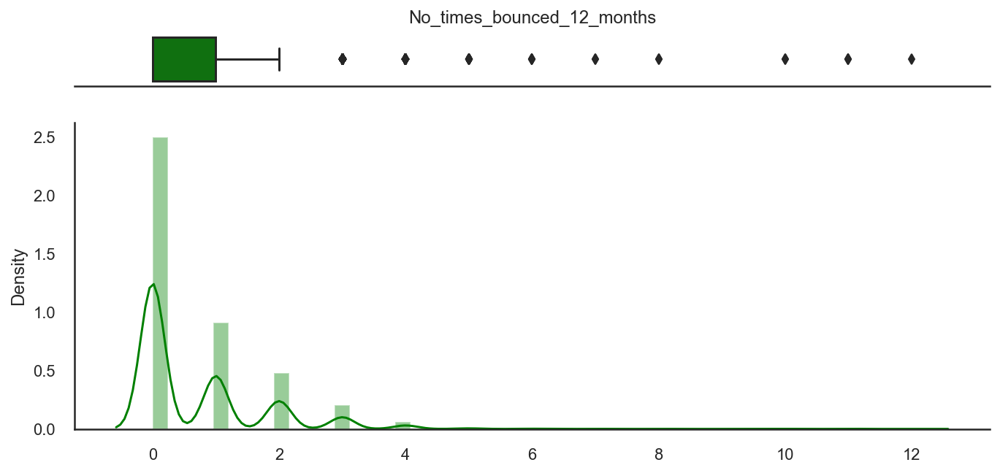

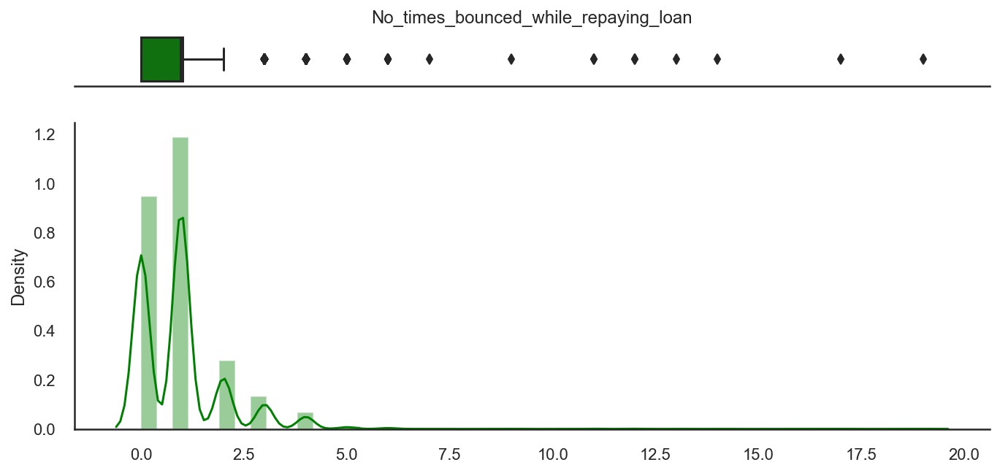

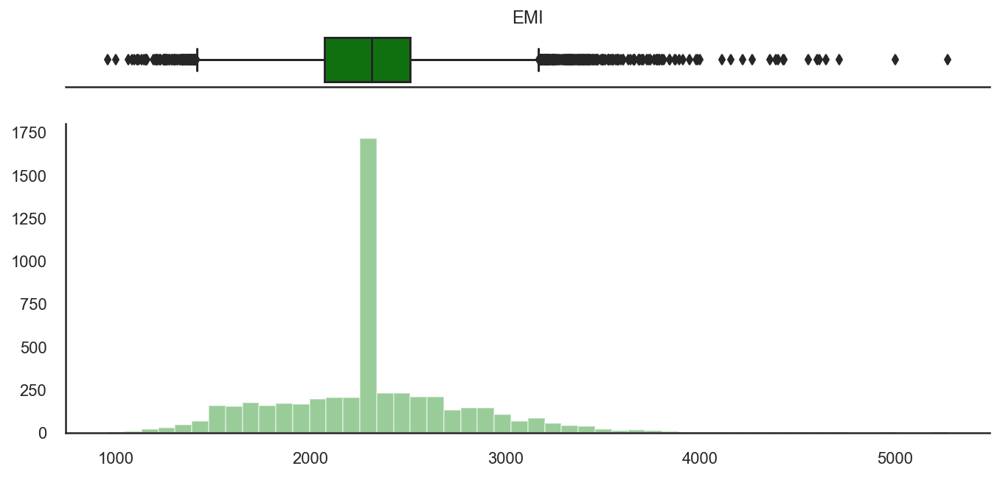

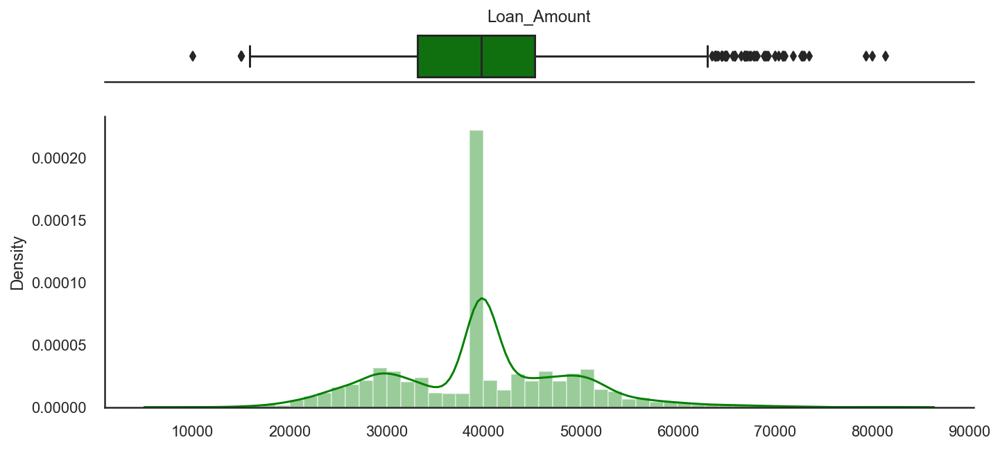

...

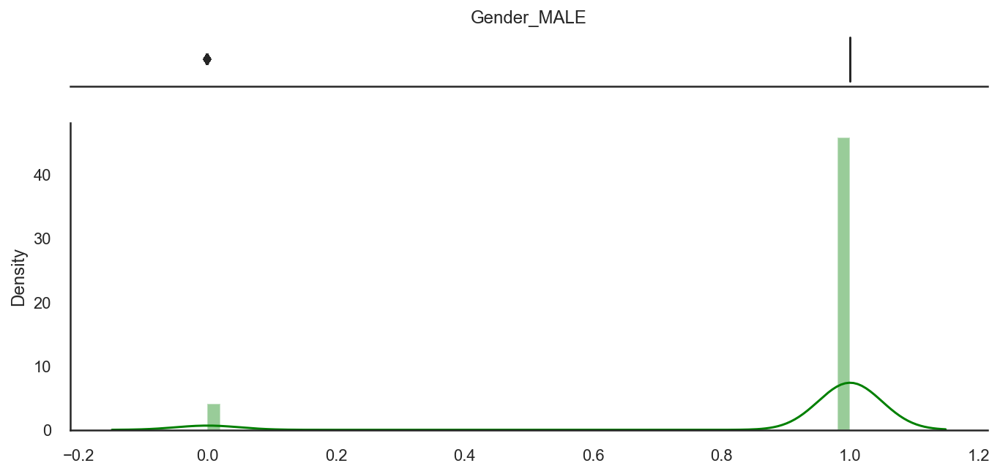

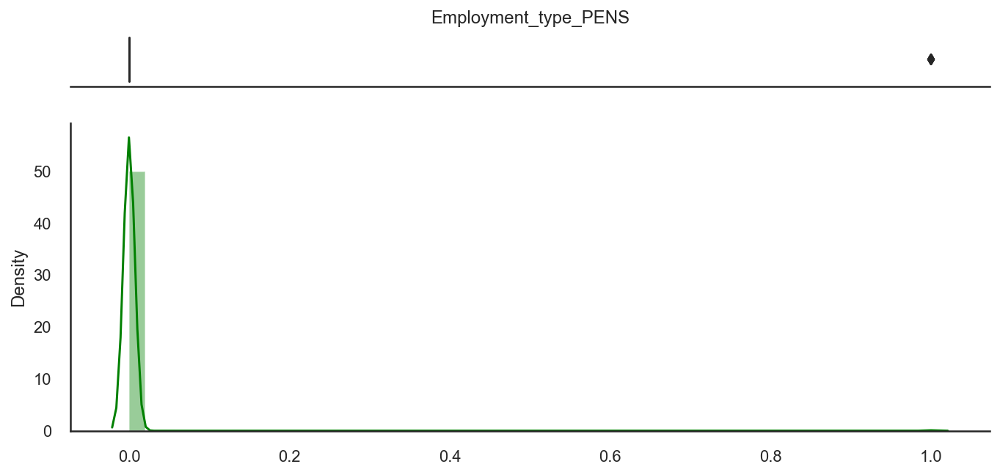

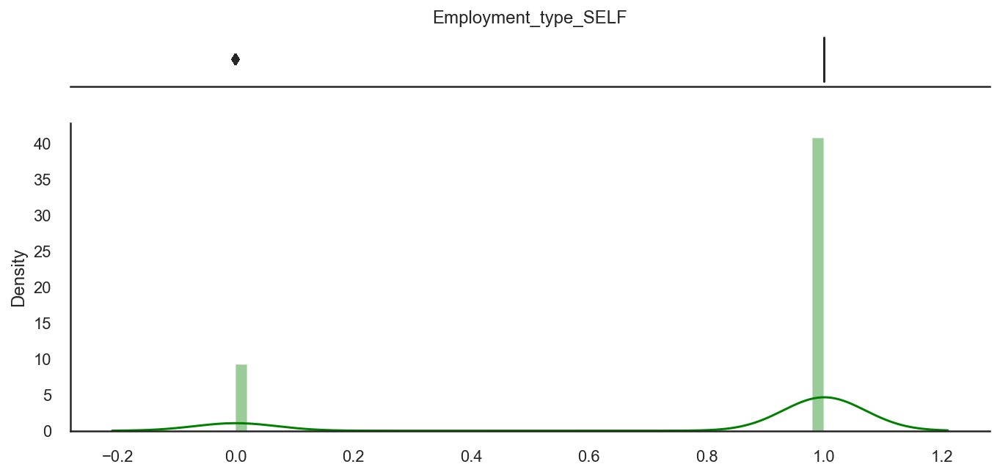

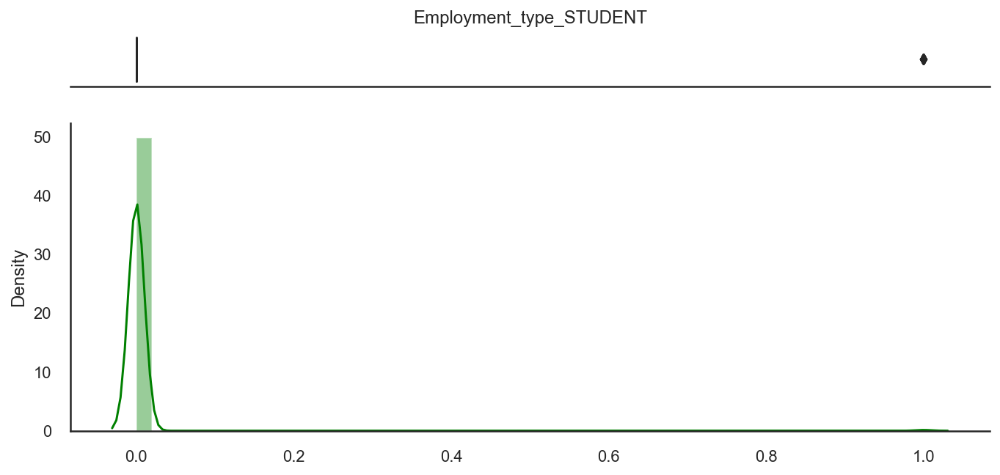

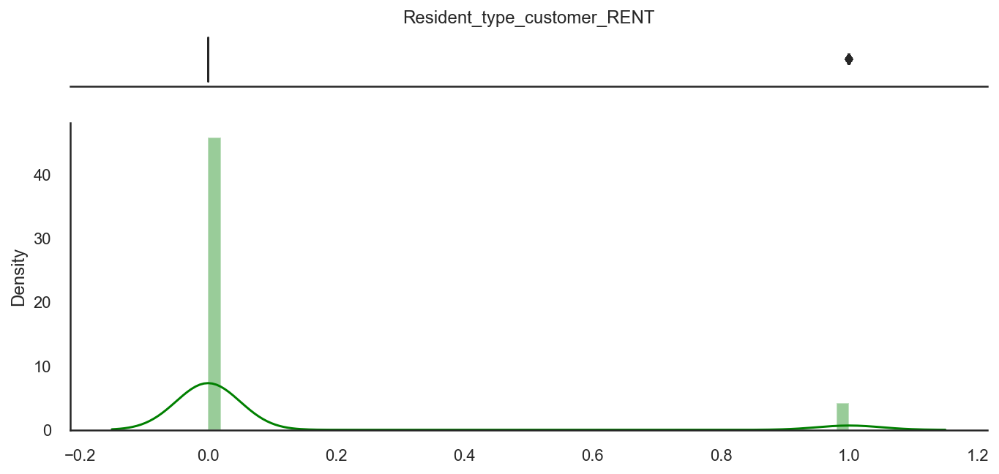

In [31]:
# Checking for Outliers and looking at variables distribution
for c in df2.columns:
    fig, ax = plt.subplots(2, 
                           figsize = (10, 5),
                           sharex = True, 
                           gridspec_kw = {'height_ratios': (0.15, 0.85)})

    ax_box = ax[0]
    ax_box = sns.boxplot(df2[c], ax = ax_box, color = 'green')
    ax_box.set(title = c, yticks = [], xlabel = '')
    sns.despine(ax = ax_box, left = True)
    

    ax_hist = ax[1]
    if c not in ['Customer_bounced_first_EMI', 'EMI']:
        ax_hist = sns.distplot(df2[c], ax = ax_hist, color = 'green')
    else:
        ax_hist = sns.distplot(df2[c], ax = ax_hist, kde=False, color='green')
    
    ax_hist.set(xlabel = '')
    sns.despine(ax = ax_hist)

plt.show()

In [32]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
scaler = StandardScaler()

In [35]:
# Scaling data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [36]:
# Splitted data
print('X_train_scaled shape is ' , X_train_scaled.shape)
print('X_test_scaled shape is ' , X_test_scaled.shape)

print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train_scaled shape is  (4182, 21)
X_test_scaled shape is  (1046, 21)
y_train shape is  (4182, 1)
y_test shape is  (1046, 1)


In [37]:
# Calculate correlation matrix with .corr() method 

Xcorr = pd.DataFrame(X_train_scaled, columns=X.columns).corr()
Xcorr

,Customer_bounced_first_EMI,No_times_bounced_12_months,No_times_bounced_while_repaying_loan,EMI,Loan_Amount,Tenure,No_advance_EMI_paid,Interest_rate,Customer_age_when_taken_loan,No_loans,...,Maximum_amount_sanctioned_for_any_Two_wheeler_loan,No_times_30_days_past_due_in_last_6_months,Product_code_Two_wheeler_MO,Product_code_Two_wheeler_SC,Product_code_Two_wheeler_TL,Gender_MALE,Employment_type_PENS,Employment_type_SELF,Employment_type_STUDENT,Resident_type_customer_RENT
Customer_bounced_first_EMI,1.000000,0.080737,0.163542,0.008468,0.010910,0.001917,0.014197,-0.021214,-0.017856,-0.008398,...,0.024924,-0.007143,-0.032398,0.000834,0.013859,-0.010410,-0.008006,0.002529,-0.012118,-0.001656
No_times_bounced_12_months,0.080737,1.000000,0.731241,-0.028038,-0.040673,-0.012265,0.026578,0.064940,-0.040231,-0.080872,...,-0.042184,0.033471,0.037185,-0.058564,-0.042275,0.014498,-0.004531,0.064490,-0.028907,-0.031301
No_times_bounced_while_repaying_loan,0.163542,0.731241,1.000000,-0.055795,0.014162,0.095206,0.028657,0.109629,-0.048337,-0.057876,...,0.010300,0.017147,0.017375,-0.048876,-0.064722,-0.003050,-0.008727,0.057740,-0.039100,-0.009373
EMI,0.008468,-0.028038,-0.055795,1.000000,0.655105,-0.287549,0.036370,-0.310936,-0.169871,0.057739,...,0.357217,0.042149,-0.529324,0.294143,-0.062832,-0.051556,0.011607,-0.111309,0.051018,0.014378
Loan_Amount,0.010910,-0.040673,0.014162,0.655105,1.000000,0.486476,0.190418,-0.067301,-0.186965,0.101085,...,0.571237,0.088283,-0.609622,0.365467,-0.246143,-0.073009,-0.006799,-0.156955,0.041953,0.052267
Tenure,0.001917,-0.012265,0.095206,-0.287549,0.486476,1.000000,0.069961,0.389415,-0.029878,0.057078,...,0.294789,0.057053,-0.162010,0.104814,-0.226320,-0.029024,-0.015265,-0.065854,-0.008613,0.036373
No_advance_EMI_paid,0.014197,0.026578,0.028657,0.036370,0.190418,0.069961,1.000000,-0.380353,-0.023870,0.013421,...,0.086885,0.013660,-0.021814,0.049386,-0.180965,-0.004738,-0.023832,-0.004011,0.003247,0.005702
Interest_rate,-0.021214,0.064940,0.109629,-0.310936,-0.067301,0.389415,-0.380353,1.000000,0.088350,-0.061096,...,-0.015980,-0.054266,0.151265,-0.268540,0.196003,0.074232,-0.001237,0.056428,0.004323,-0.056668
Customer_age_when_taken_loan,-0.017856,-0.040231,-0.048337,-0.169871,-0.186965,-0.029878,-0.023870,0.088350,1.000000,0.013518,...,-0.129869,-0.078223,0.185391,-0.032442,0.051341,0.043878,0.090102,0.094605,-0.103917,-0.014196
No_loans,-0.008398,-0.080872,-0.057876,0.057739,0.101085,0.057078,0.013421,-0.061096,0.013518,1.000000,...,0.164225,0.353996,-0.014663,0.166395,-0.144228,-0.017483,0.010342,-0.036064,-0.023153,0.069068


### Random Forest Classification Feature Importance

In [445]:
X.columns

Index(['Customer_bounced_first_EMI', 'No_times_bounced_12_months',
       'No_times_bounced_while_repaying_loan', 'EMI', 'Loan_Amount', 'Tenure',
       'No_advance_EMI_paid', 'Interest_rate', 'Customer_age_when_taken_loan',
       'No_loans', 'No_unsecured_loans',
       'Maximum_amount_sanctioned_for_any_Two_wheeler_loan',
       'No_times_30_days_past_due_in_last_6_months',
       'Product_code_Two_wheeler_MO', 'Product_code_Two_wheeler_SC',
       'Product_code_Two_wheeler_TL', 'Gender_MALE', 'Employment_type_PENS',
       'Employment_type_SELF', 'Employment_type_STUDENT',
       'Resident_type_customer_RENT'],
      dtype='object')

Feature: 0, Score: 0.00795
Feature: 1, Score: 0.04237
Feature: 2, Score: 0.02959
Feature: 3, Score: 0.07263
Feature: 4, Score: 0.06834
Feature: 5, Score: 0.02849
Feature: 6, Score: 0.02029
Feature: 7, Score: 0.06009
Feature: 8, Score: 0.07243
Feature: 9, Score: 0.08803
Feature: 10, Score: 0.03236
Feature: 11, Score: 0.14954
Feature: 12, Score: 0.28208
Feature: 13, Score: 0.00599
Feature: 14, Score: 0.00842
Feature: 15, Score: 0.00337
Feature: 16, Score: 0.00797
Feature: 17, Score: 0.00048
Feature: 18, Score: 0.01089
Feature: 19, Score: 0.00089
Feature: 20, Score: 0.00781


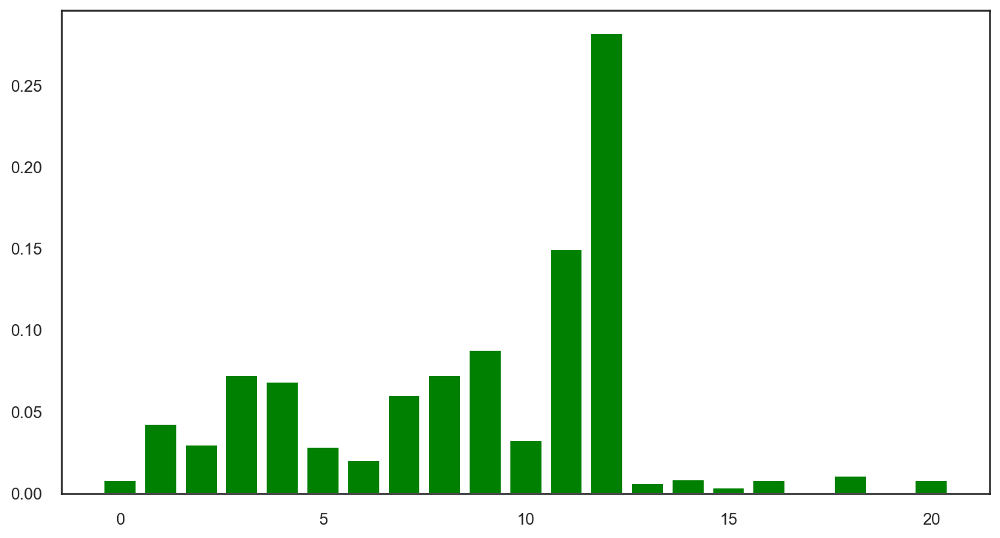

In [450]:
from sklearn.ensemble import RandomForestClassifier

# define the model
model = RandomForestClassifier(random_state=0)
# fit the model
model.fit(X_train_scaled, y_train)
# get importance
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance, color='green')
pyplot.show()

# Defining and Fitting Models with 8 features

In [201]:
df3= df2.drop(['Customer_bounced_first_EMI', 'No_times_bounced_while_repaying_loan', 'Tenure', 'No_advance_EMI_paid', 'No_unsecured_loans', 'Product_code_Two_wheeler_MO', 'Product_code_Two_wheeler_SC', 'Product_code_Two_wheeler_TL', 'Gender_MALE', 'Employment_type_PENS', 'Employment_type_SELF', 'Employment_type_STUDENT', 'Resident_type_customer_RENT'], axis=1)

In [202]:
df3.shape

(5228, 9)

In [203]:
df3.columns

Index(['No_times_bounced_12_months', 'EMI', 'Loan_Amount', 'Interest_rate',
       'Customer_age_when_taken_loan', 'No_loans',
       'Maximum_amount_sanctioned_for_any_Two_wheeler_loan',
       'No_times_30_days_past_due_in_last_6_months', 'Target'],
      dtype='object')

In [204]:
# Create X and y to match Scikit_learn
features = ['No_times_bounced_12_months', 'EMI', 'Loan_Amount', 'Interest_rate', 'Customer_age_when_taken_loan', 'No_loans', 'Maximum_amount_sanctioned_for_any_Two_wheeler_loan', 'No_times_30_days_past_due_in_last_6_months']
outcome = 'Target'

# X1 include all the features
X1 = df3[features].copy()

# y1 is the target variable
# Note: As it is a classification problem, 0 and 1 are converted to '0' and '1' (int to str)
y1 = df3[outcome].copy()

In [205]:
X1.head()

,No_times_bounced_12_months,EMI,Loan_Amount,Interest_rate,Customer_age_when_taken_loan,No_loans,Maximum_amount_sanctioned_for_any_Two_wheeler_loan,No_times_30_days_past_due_in_last_6_months
CustomerID,,,,,,,,
66470,0,2690.000000,51427.000000,12.750000,28.000000,6,51427.0,0
84206,0,2314.000000,57850.000000,8.000000,35.000000,4,57850.0,0
8318,0,1911.000000,28655.000000,0.000000,28.000000,1,28655.0,0
41311,0,2518.000000,49900.000000,10.550000,46.000000,8,49900.0,0
102951,2,2313.243718,39765.521751,11.821535,35.799514,1,34000.0,0


In [206]:
y1

CustomerID
66470     0
84206     0
8318      0
41311     0
102951    0
         ..
119383    1
119460    1
119484    1
119506    1
119525    1
Name: Target, Length: 5228, dtype: int64

In [207]:
y1.shape

(5228,)

In [208]:
y1.unique()

array([0, 1], dtype=int64)

In [209]:
# train is 80% of the entire data set
from sklearn.model_selection import StratifiedShuffleSplit
X1_train, X1_test, y1_train, y1_test =train_test_split(X1, y1, test_size=0.20, random_state=42, stratify=y1)

In [210]:
# Splitted data
print('X1_train shape is ' , X1_train.shape)
print('X1_test shape is ' , X1_test.shape)

print('y1_train shape is ' , y1_train.shape)
print('y1_test shape is ' , y1_test.shape)

X1_train shape is  (4182, 8)
X1_test shape is  (1046, 8)
y1_train shape is  (4182,)
y1_test shape is  (1046,)


In [211]:
# Scaling data
scaler = StandardScaler()
X1_train_scaled = scaler.fit_transform(X1_train)
X1_test_scaled = scaler.transform(X1_test)

In [212]:
# Splitted data
print('X1_train_scaled shape is ' , X1_train_scaled.shape)
print('X1_test_scaled shape is ' , X1_test_scaled.shape)

print('y1_train shape is ' , y1_train.shape)
print('y1_test shape is ' , y1_test.shape)

X1_train_scaled shape is  (4182, 8)
X1_test_scaled shape is  (1046, 8)
y1_train shape is  (4182,)
y1_test shape is  (1046,)


### Random Forest Classifier

In [213]:
from sklearn.ensemble import RandomForestClassifier
rf1 = RandomForestClassifier()

In [214]:
# Train and fit model
rf1 = rf1.fit(X1_train_scaled, y1_train)

In [215]:
# Cross validation
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results1 = model_selection.cross_val_score(rf1, X1_train_scaled, y1_train, cv = kfold)

print('Random Forest, Cross-Validation mean: %.4f' % results1.mean())

Random Forest, Cross-Validation mean: 0.7539


### Decision tree classifier

In [233]:
# Train and fit model
dt1 = DecisionTreeClassifier()
print(model)

RandomForestClassifier()


In [235]:
dt1 = dt1.fit(X1_train_scaled, y1_train)

In [236]:
# Cross validation
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results2 = model_selection.cross_val_score(dt1, X1_train_scaled, y1_train, cv = kfold)

print('Decision Tree, Cross-Validation mean: %.4f' % results2.mean())

Decision Tree, Cross-Validation mean: 0.6746


### Super Vector Machine

In [218]:
y1_test.shape

(1046,)

In [219]:
# Train model
svm1 = SVC(kernel='rbf', probability=True)
svm1 = svm1.fit(X1_train_scaled, y1_train.values.ravel())

In [220]:
# Cross validation
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results3 = model_selection.cross_val_score(svm1, X1_train_scaled, y1_train, cv = kfold)

print('Super Vector Machine, Cross-Validation mean: %.4f' % results3.mean())

Super Vector Machine, Cross-Validation mean: 0.7398


### KNN

In [221]:
X_train_scaled.shape

(4182, 21)

In [222]:
# The optimal K value usually found is the square root of N, where N is the total number of samples.
np.sqrt(4182)
# Ideal n_neighbours for testing 54 - 74

64.66838485689897

In [223]:
# Train model

from sklearn.neighbors import KNeighborsClassifier
# make an instance of a KNeighborsClassifier object with 65 neighbor
knn1 = KNeighborsClassifier(n_neighbors=65)

# fit and train the data:
knn1 = knn1.fit(X1_train_scaled, y1_train.values.ravel())

In [224]:
# Cross validation
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results4 = model_selection.cross_val_score(knn1, X1_train_scaled, y1_train, cv = kfold)

print('KNN, Cross-Validation mean: %.4f' % results4.mean())

KNN, Cross-Validation mean: 0.6954


### Logistic Regression

In [225]:
# Fit and Train the model
from sklearn.linear_model import LogisticRegression
log1 = LogisticRegression()
log1 = log1.fit(X1_train_scaled, y1_train.values.ravel())

In [226]:
# Cross validation
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results5 = model_selection.cross_val_score(log1, X1_train_scaled, y1_train, cv = kfold)

print('Logistic Regression, Cross-Validation mean: %.4f' % results5.mean())

Logistic Regression, Cross-Validation mean: 0.7410


### Ensemble Model Stacking

In [237]:
sclf = StackingClassifier(
    classifiers = [rf1, dt1, svm1, knn1],
    meta_classifier = log1)
sclf.fit(X1_train_scaled, y1_train)

StackingClassifier(classifiers=[RandomForestClassifier(),
                                DecisionTreeClassifier(), SVC(probability=True),
                                KNeighborsClassifier(n_neighbors=65)],
                   meta_classifier=LogisticRegression())

In [238]:
kfold = model_selection.KFold(n_splits = 10, random_state = 7, shuffle=True)

results6 = model_selection.cross_val_score(sclf, X1_train_scaled, y1_train, cv = kfold)

print('Stacking, Cross-Validation mean: %.4f' % results6.mean())

Stacking, Cross-Validation mean: 0.7360


# Verify and Evaluate Training Models

In [239]:
def show_summary_report(actual, prediction):

    if isinstance(actual, pd.Series):
        actual = actual.values
    if actual.dtype.name == 'object':
        actual = actual.astype(int)
    if prediction.dtype.name == 'object':
        prediction = prediction.astype(int)

    accuracy_ = accuracy_score(actual, prediction)
    precision_ = precision_score(actual, prediction)
    recall_ = recall_score(actual, prediction)
    roc_auc_ = roc_auc_score(actual, prediction)

    print('Accuracy : %.4f [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0' % accuracy_)
    print('Precision: %.4f [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0' % precision_)
    print('Recall   : %.4f [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0' % recall_)
    print('ROC AUC  : %.4f                                                                     Best: 1, Worst: < 0.5' % roc_auc_)
    print('-' * 107)
    print('TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples')

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, prediction)
    average_precision = average_precision_score(actual, prediction)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, prediction)
    roc_auc = auc(fpr, tpr)

    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
    fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False, cmap = 'Greens', ax = ax[0])

    ax[0].set_title('Confusion Matrix')
    ax[0].set_xlabel('True label')
    ax[0].set_ylabel('Predicted label')
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', alpha = 0.2, where = 'post')
    ax[1].fill_between(recall, precision, alpha = 0.2, color = 'green', **step_kwargs)
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('2-class Precision-Recall curve')

    # ROC
    ax[2].plot(fpr, tpr, color = 'green', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'darkgray', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate')
    ax[2].set_ylabel('True Positive Rate')
    ax[2].set_title('Receiver Operating Characteristic')
    ax[2].legend(loc = 'lower right')

    plt.show()
    
    return (accuracy_, precision_, recall_, roc_auc_)

In [240]:
y1_train.dtypes

dtype('int64')

In [241]:
y1_train

CustomerID
71191     1
18190     0
116684    0
4600      0
49686     0
         ..
91380     0
63866     0
56028     0
99329     0
78350     1
Name: Target, Length: 4182, dtype: int64

**********************************
* Random Forest Classifier *
**********************************
Accuracy : 0.9811 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.9907 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.9713 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9811                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


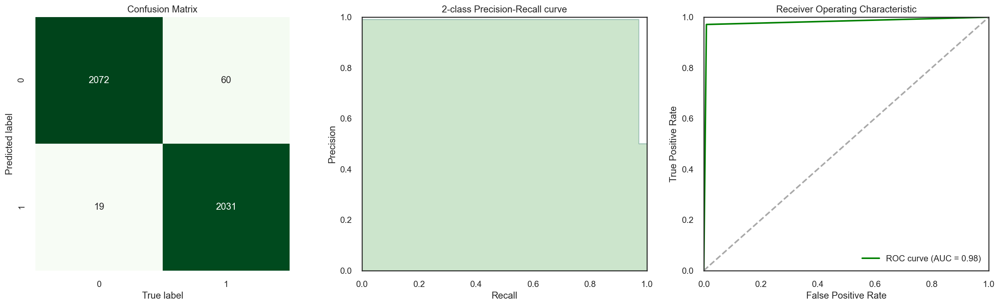


**********************************
* Decision Tree Classifier *
**********************************
Accuracy : 0.9811 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.9927 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.9694 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9811                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


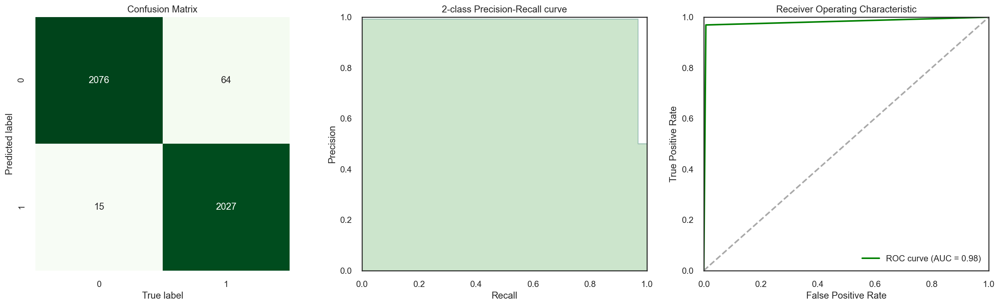


******************************
* Super Vector Machine *
******************************
Accuracy : 0.7626 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8397 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6490 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7626                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


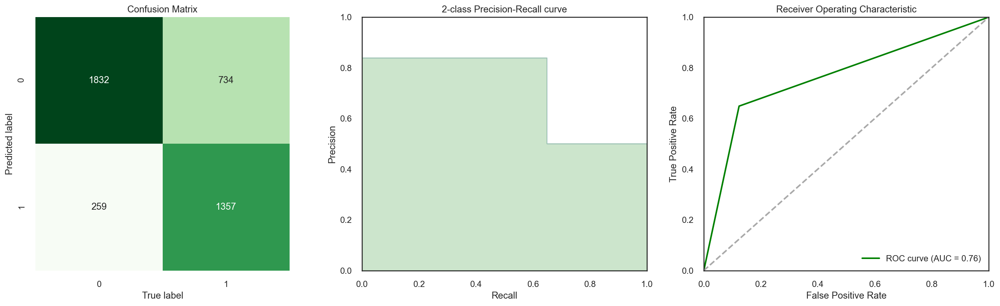


*************
* KNN *
*************
Accuracy : 0.7097 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7493 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6303 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7097                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


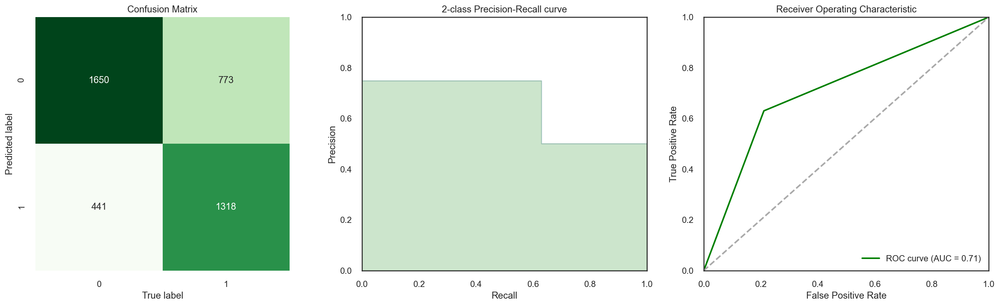


*****************************
* Logistic Regression *
*****************************
Accuracy : 0.7418 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8073 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6351 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7418                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


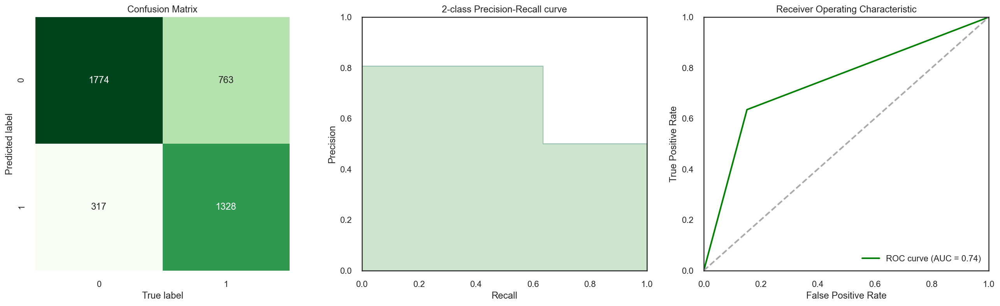


******************
* Stacking *
******************
Accuracy : 0.9809 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.9917 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.9699 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9809                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


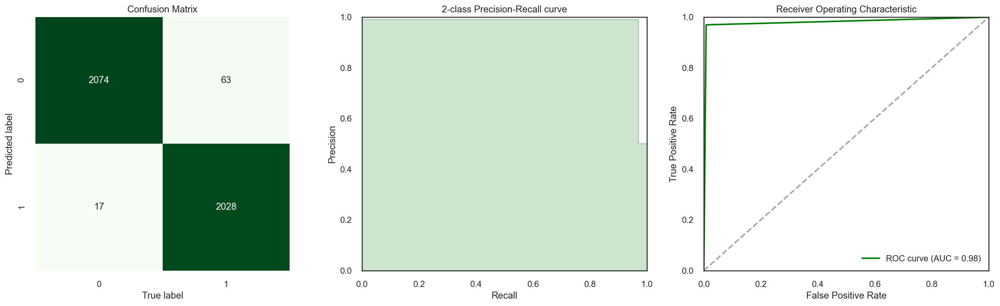

In [242]:
# Keep the results in a dataframe
results_train = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Random Forest Classifier', 'Decision Tree Classifier', 'Super Vector Machine', 'KNN', 'Logistic Regression', 'Stacking']
for i, m in enumerate([rf1, dt1, svm1, knn1, log1, sclf]):
    print('*' * (len(models[i]) + 10))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 10))
    predictions = m.predict(X1_train_scaled)
    
   
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_train, predictions)
    # keep the results
    results_train.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}
    print()

In [243]:
results_train

,Model,Accuracy,Precision,Recall,ROC_AUC
0,Random Forest Classifier,0.981110,0.990732,0.971306,0.981110
1,Decision Tree Classifier,0.981110,0.992654,0.969393,0.981110
2,Super Vector Machine,0.762554,0.839728,0.648972,0.762554
3,KNN,0.709708,0.749289,0.630320,0.709708
4,Logistic Regression,0.741750,0.807295,0.635103,0.741750
5,Stacking,0.980870,0.991687,0.969871,0.980870


# Make Predictions and Evaluate the Test Model

**********************************
* Random Forest Classifier *
**********************************
Accuracy : 0.7266 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7394 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6998 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7266                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


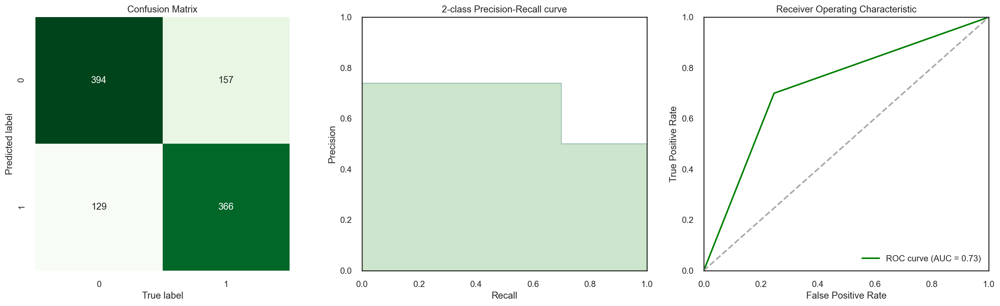


**********************************
* Decision Tree Classifier *
**********************************
Accuracy : 0.6625 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6673 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6482 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.6625                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


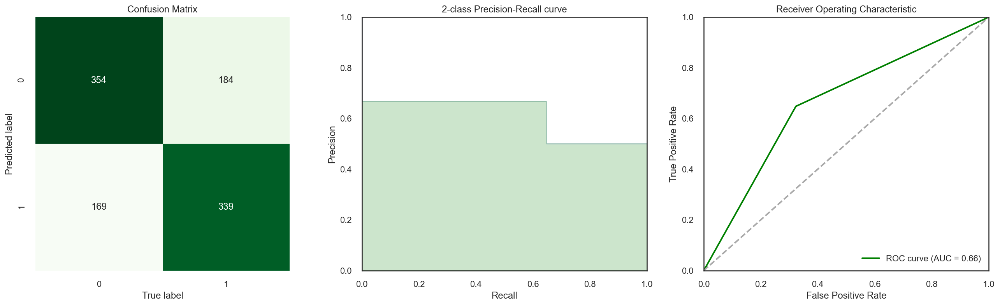


******************************
* Super Vector Machine *
******************************
Accuracy : 0.7199 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7875 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6023 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7199                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


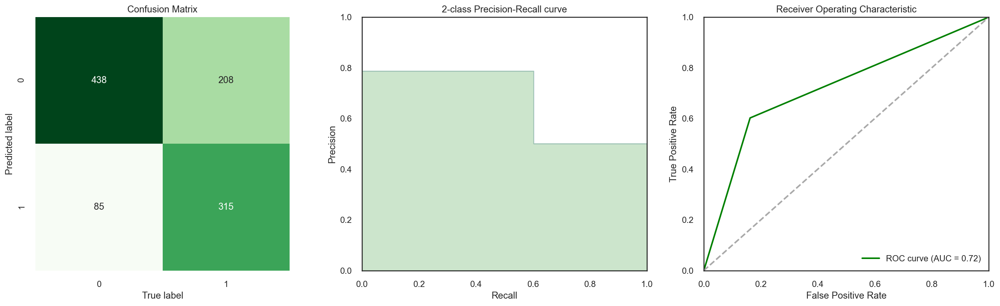


*************
* KNN *
*************
Accuracy : 0.6883 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7213 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6138 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.6883                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


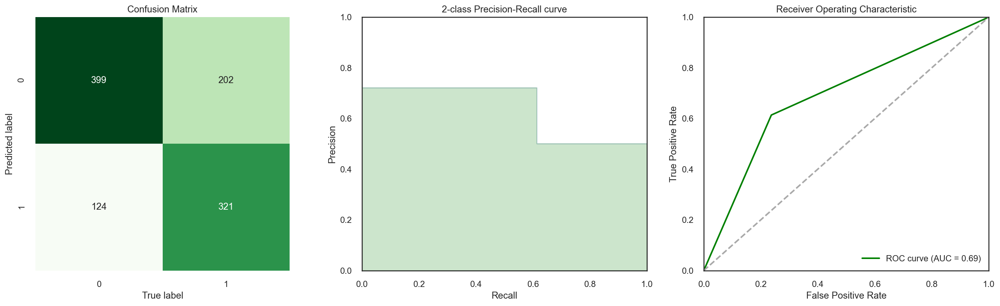


*****************************
* Logistic Regression *
*****************************
Accuracy : 0.7275 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7861 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6252 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7275                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


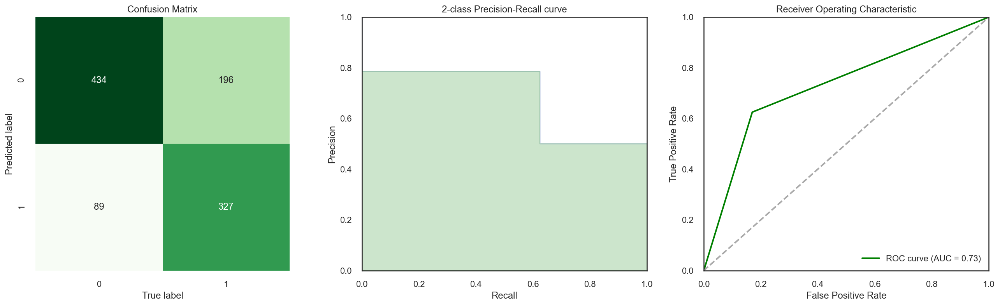


******************
* Stacking *
******************
Accuracy : 0.6864 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.6763 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7151 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.6864                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


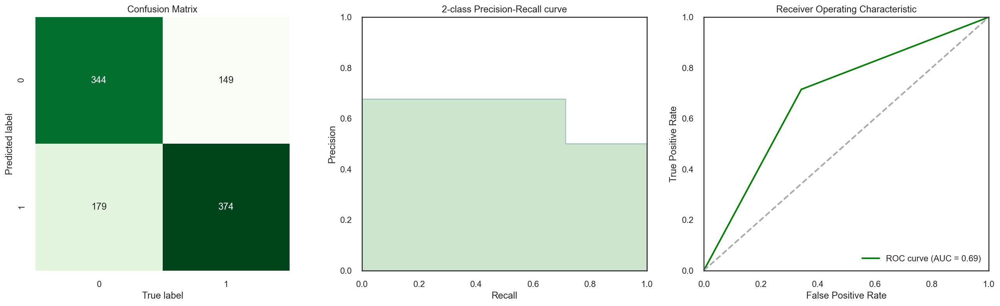

In [244]:
# Keep the results in a dataframe
results_test = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Random Forest Classifier', 'Decision Tree Classifier', 'Super Vector Machine', 'KNN', 'Logistic Regression', 'Stacking']
for i, m in enumerate([rf1, dt1, svm1, knn1, log1,sclf]):
    print('*' * (len(models[i]) + 10))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 10))
    predictions = m.predict(X1_test_scaled)
    
   
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_test, predictions)
    # keep the results
    results_test.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}
    print()

In [245]:
results_test

,Model,Accuracy,Precision,Recall,ROC_AUC
0,Random Forest Classifier,0.726577,0.739394,0.699809,0.726577
1,Decision Tree Classifier,0.662524,0.667323,0.648184,0.662524
2,Super Vector Machine,0.719885,0.787500,0.602294,0.719885
3,KNN,0.688337,0.721348,0.613767,0.688337
4,Logistic Regression,0.727533,0.786058,0.625239,0.727533
5,Stacking,0.686424,0.676311,0.715105,0.686424


## ROC AUC for 5 models

In [246]:
from sklearn.exceptions import NotFittedError

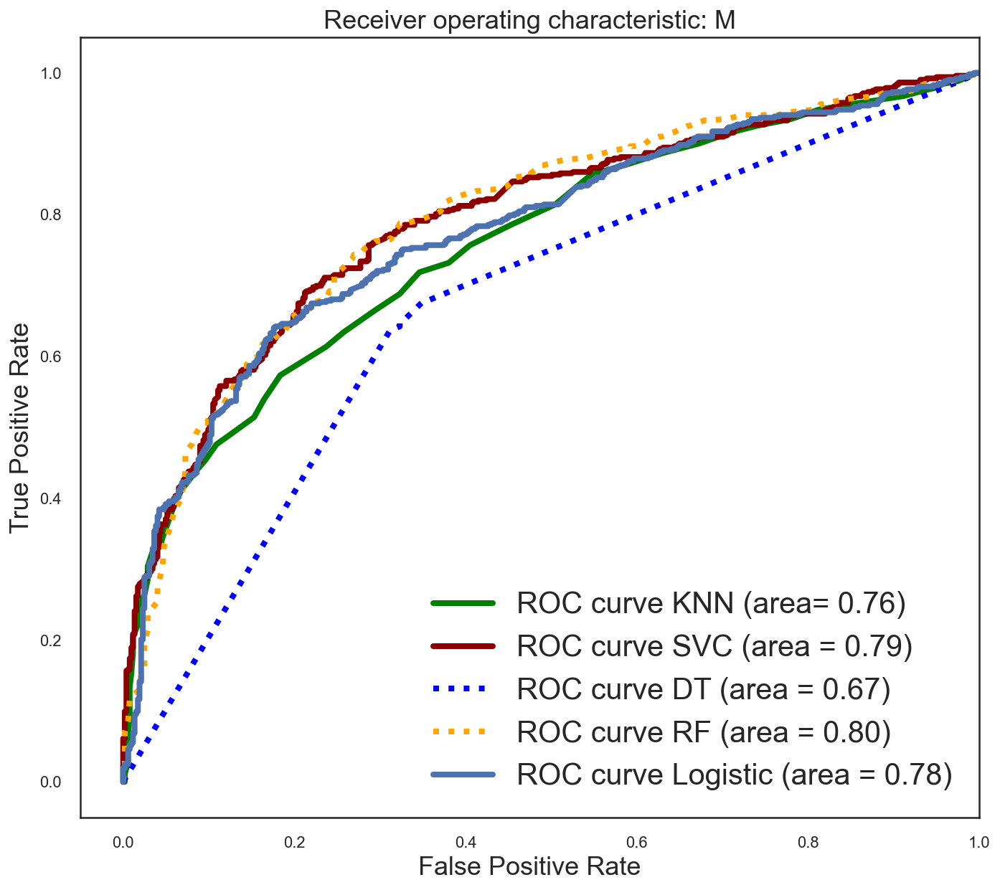

In [451]:
yhat_pp_knn1 = knn1.predict_proba(X1_test_scaled)
yhat_pp = svm1.predict_proba(X1_test_scaled)
yhat_pp_dt1 = dt1.predict_proba(X1_test_scaled)
yhat_pp_rf1 = rf1.predict_proba(X1_test_scaled)
yhat_pp_log1 = log1.predict_proba(X1_test_scaled)


fpr_knn1, tpr_knn1, _ = roc_curve(y_test, yhat_pp_knn1[:,1])
fpr_svm1, tpr_svm1, _ = roc_curve(y_test, yhat_pp[:,1])
fpr_dt1, tpr_dt1, _ = roc_curve(y_test, yhat_pp_dt1[:,1])
fpr_rf1, tpr_rf1, _ = roc_curve(y_test, yhat_pp_rf1[:,1])
fpr, tpr, _ = roc_curve(y_test, yhat_pp_log1[:,1])

plt.figure(figsize=[10,10])

plt.plot(fpr_knn1, tpr_knn1, label= 'ROC curve KNN (area= %0.2f)' % auc(fpr_knn1, tpr_knn1), linewidth=4, color='green')
plt.plot(fpr_svm1, tpr_svm1, label='ROC curve SVC (area = %0.2f)' % auc(fpr_svm1, tpr_svm1), linewidth=4, color='darkred')
plt.plot(fpr_dt1, tpr_dt1, label='ROC curve DT (area = %0.2f)' % auc(fpr_dt1, tpr_dt1), linewidth=4, ls= ':', color='blue')
plt.plot(fpr_rf1, tpr_rf1, label='ROC curve RF (area = %0.2f)' % auc(fpr_rf1, tpr_rf1), linewidth=4, ls= ':', color='orange')
plt.plot(fpr, tpr, label='ROC curve Logistic (area = %0.2f)' % auc(fpr, tpr), linewidth=4)

plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=18)
plt.ylabel('True Positive Rate', fontsize=18)
plt.title('Receiver operating characteristic: M', fontsize=18)
plt.legend(loc="lower right", fontsize='xx-large')
plt.show()

### Hyperparameter Optimization for 2 models & 8 selected features

In [186]:
# random search logistic regression model on the sonar dataset
from scipy.stats import loguniform
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold

### Logistic Regression optimization

In [192]:
X1_train_scaled.shape

(4182, 8)

In [193]:
X1_test_scaled.shape

(1046, 8)

In [194]:
y1_train.shape

(4182, 1)

In [195]:
y1_test.shape

(1046, 1)

In [196]:
# define model
log_model = LogisticRegression()
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=10, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(log_model, space, n_iter=500, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)
# execute search
result = search.fit(X1_train_scaled, y1_train.values.ravel())
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.7389573032168183
Best Hyperparameters: {'C': 6.093249806997543, 'penalty': 'l2', 'solver': 'liblinear'}


### Random Forest Classifier optimization

In [197]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

In [198]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10, 15]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10, 15, 20], 'min_samples_leaf': [1, 2, 5, 10, 15], 'bootstrap': [True, False]}


In [199]:
RFR2 = RandomForestRegressor(random_state=1)
RFR2_random = RandomizedSearchCV(estimator = RFR2,
                               param_distributions = random_grid, n_iter = 500,
                               cv = 5, verbose =1, random_state=42)

In [200]:
RFR2_model = RFR2_random.fit(X1_train_scaled, y1_train.values.ravel())
print(RFR2_model.best_params_)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
{'n_estimators': 1200, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 10, 'bootstrap': True}


# BOOSTING 

In [332]:
from sklearn.ensemble import AdaBoostClassifier

In [333]:
X1_train_scaled.shape

(4182, 8)

In [334]:
y1_train.shape

(4182,)

### Using Random Forest with 8 feature importance from random forest and optimized hyperparameters 

In [421]:
# Define and fit the models Optimized
from sklearn.ensemble import RandomForestClassifier
kfold = KFold(n_splits = 15, random_state = 42, shuffle=True)
rf3_opti= RandomForestClassifier(n_estimators= 1200, min_samples_split= 15, min_samples_leaf= 5, max_features= 'log2', max_depth= 10, bootstrap= True)

rf3_opti.fit(X1_train_scaled, y1_train)


results3 = cross_val_score(rf3_opti, X1_train_scaled, y1_train.values.ravel(), cv = kfold)
print('Random Forest Opti, Cross-Validation mean : %.4f', results3.mean())

Random Forest Opti, Cross-Validation mean : %.4f 0.7752284194150056


In [422]:
seed = 7
kfold = model_selection.KFold(n_splits = 15, random_state = seed, shuffle=True)
rf_AB = AdaBoostClassifier(n_estimators = 1600, random_state = seed)
rf_AB.fit(X1_train_scaled, y1_train)
results3 = model_selection.cross_val_score(rf_AB, X1_train_scaled, y1_train.values.ravel(), cv = kfold)
print('AdaBoost RF, Cross-Validation mean: %.4f' % results3.mean())

AdaBoost RF, Cross-Validation mean: 0.7499


##### Verify and Evaluate the training models

In [423]:
def show_summary_report(actual, prediction, probabilities):

    if isinstance(actual, pd.Series):
        actual = actual.values
    if actual.dtype.name == 'object':
        actual = actual.astype(int)
    if prediction.dtype.name == 'object':
        prediction = prediction.astype(int)

    accuracy_ = accuracy_score(actual, prediction)
    precision_ = precision_score(actual, prediction)
    recall_ = recall_score(actual, prediction)
    roc_auc_ = roc_auc_score(actual, probabilities[:, 1])
    
    print('Accuracy : %.4f [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0' % accuracy_)
    print('Precision: %.4f [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0' % precision_)
    print('Recall   : %.4f [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0' % recall_)
    print('ROC AUC  : %.4f                                                                     Best: 1, Worst: < 0.5' % roc_auc_)
    print('-' * 107)
    print('TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples')

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, prediction)
    average_precision = average_precision_score(actual, prediction)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, probabilities[:, 1])
    roc_auc = auc(fpr, tpr)

    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
    fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False, cmap = 'Greens', ax = ax[0])

    ax[0].set_title('Confusion Matrix')
    ax[0].set_xlabel('True label')
    ax[0].set_ylabel('Predicted label')
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', alpha = 0.2, where = 'post')
    ax[1].fill_between(recall, precision, alpha = 0.2, color = 'green', **step_kwargs)
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('2-class Precision-Recall curve')

    # ROC
    ax[2].plot(fpr, tpr, color = 'green', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'gray', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate')
    ax[2].set_ylabel('True Positive Rate')
    ax[2].set_title('Receiver Operating Characteristic')
    ax[2].legend(loc = 'lower right')

    plt.show()
    
    return (accuracy_, precision_, recall_, roc_auc_)

**********************
* Random Forest Opti *
**********************
Accuracy : 0.8128 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8396 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7733 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9143                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


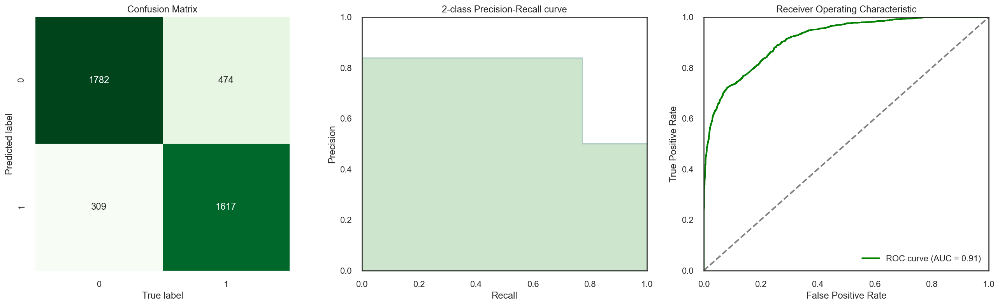

***************
* AdaBoost RF *
***************
Accuracy : 0.8044 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8067 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.8006 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8888                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


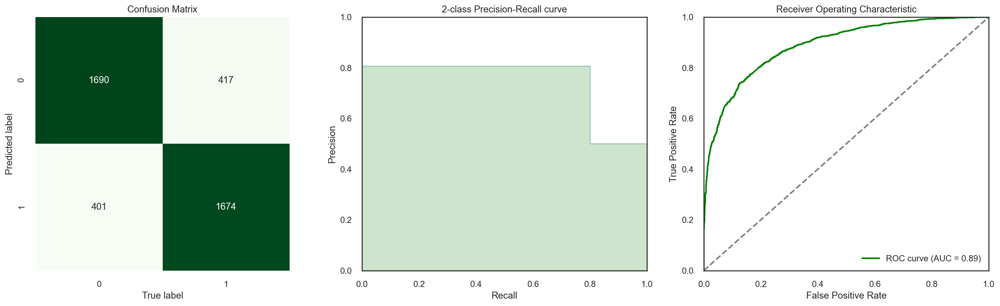

In [425]:
# Keep the results in a dataframe
results3 = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Random Forest Opti', 'AdaBoost RF']
for i, m in enumerate([rf3_opti, rf_AB]):
    print('*' * (len(models[i]) + 4))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 4))
    predictions = m.predict(X1_train_scaled)
    probabilities = m.predict_proba(X1_train_scaled)
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_train, predictions, probabilities)
    # keep the results
    results3.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}

In [426]:
results3

,Model,Accuracy,Precision,Recall,ROC_AUC
0,Random Forest Opti,0.812769,0.839564,0.773314,0.914305
1,AdaBoost RF,0.804400,0.806747,0.800574,0.888820


#### Make predictions and evaluate test model

In [427]:
predictions = rf_AB.predict(X1_test_scaled)
probabilities = rf_AB.predict_proba(X1_test_scaled)

**********************
* Random Forest Opti *
**********************
Accuracy : 0.7467 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7722 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6998 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8122                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


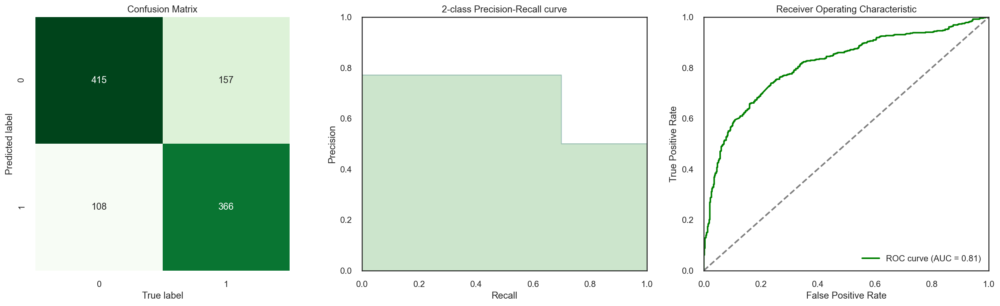

***************
* AdaBoost RF *
***************
Accuracy : 0.7438 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7466 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7380 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8052                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


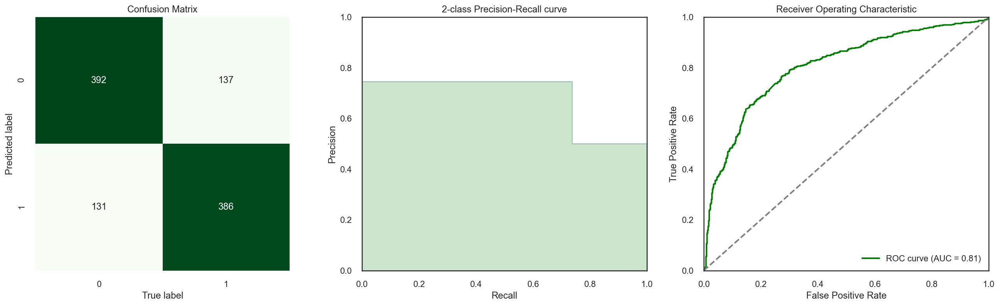

In [428]:
# Keep the results in a dataframe
results4 = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Random Forest Opti', 'AdaBoost RF']
for i, m in enumerate([rf3_opti, rf_AB]):
    print('*' * (len(models[i]) + 4))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 4))
    predictions = m.predict(X1_test_scaled)
    probabilities = m.predict_proba(X1_test_scaled)
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_test, predictions, probabilities)
    # keep the results
    results4.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}

In [429]:
results4

,Model,Accuracy,Precision,Recall,ROC_AUC
0,Random Forest Opti,0.746654,0.772152,0.699809,0.812203
1,AdaBoost RF,0.743786,0.746615,0.738050,0.805227


### Using Logistic Regression with 8 feature importance from random forest and hyperparameters 

In [430]:
kfold = KFold(n_splits = 15, random_state = 42, shuffle=True)

lg4_opti = LogisticRegression(C=6.093249806997543, penalty='l2', solver= 'liblinear') 
lg4_opti.fit(X1_train_scaled, y1_train.values.ravel())

results5 = cross_val_score(lg4_model, X1_train_scaled, y1_train.values.ravel(), cv = kfold)
print('Logistic Regression Opti, Cross-Validation mean : %.4f', results5.mean())

Logistic Regression Opti, Cross-Validation mean : %.4f 0.7412702096387406


In [431]:
seed = 7
kfold = model_selection.KFold(n_splits = 15, random_state = seed, shuffle=True)
Log_AB = AdaBoostClassifier(n_estimators = 1600, random_state = seed)
Log_AB.fit(X1_train_scaled, y1_train.values.ravel())
results5 = model_selection.cross_val_score(Log_AB, X1_train_scaled, y1_train.values.ravel(), cv = kfold)
print('AdaBoost LR, Cross-Validation mean: %.4f' % results5.mean())

AdaBoost LR, Cross-Validation mean: 0.7499


****************************
* Logistic Regression Opti *
****************************
Accuracy : 0.7420 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8070 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6361 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8018                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


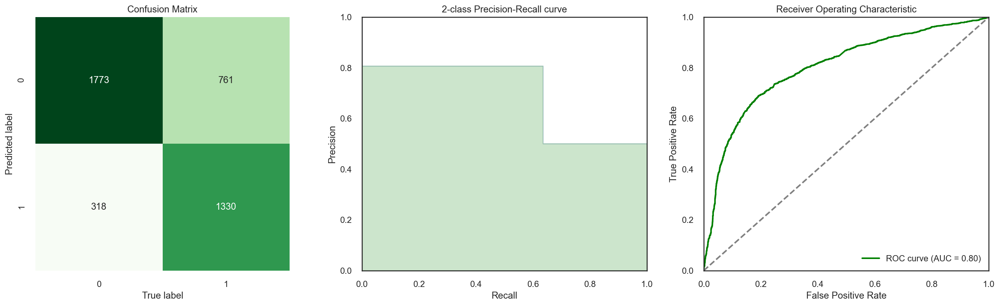

****************
* AdaBoost Log *
****************
Accuracy : 0.8044 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8067 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.8006 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8888                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


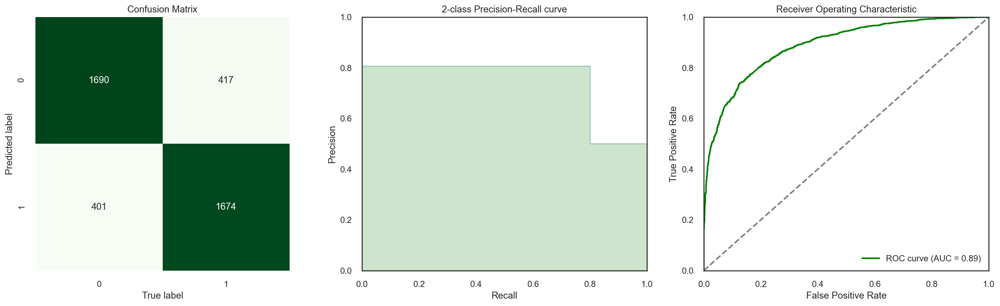

In [432]:
# Keep the results in a dataframe
results5 = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Logistic Regression Opti',  'AdaBoost Log']
for i, m in enumerate([lg4_opti, Log_AB]):
    print('*' * (len(models[i]) + 4))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 4))
    predictions = m.predict(X1_train_scaled)
    probabilities = m.predict_proba(X1_train_scaled)
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_train, predictions, probabilities)
    # keep the results
    results5.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}

In [433]:
results5

,Model,Accuracy,Precision,Recall,ROC_AUC
0,Logistic Regression Opti,0.741989,0.807039,0.636059,0.801831
1,AdaBoost Log,0.804400,0.806747,0.800574,0.888820


#### Make predictions and evaluate test model

In [434]:
predictions = Log_AB.predict(X1_test_scaled)
probabilities = Log_AB.predict_proba(X1_test)

****************************
* Logistic Regression Opti *
****************************
Accuracy : 0.7275 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7861 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.6252 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.7758                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


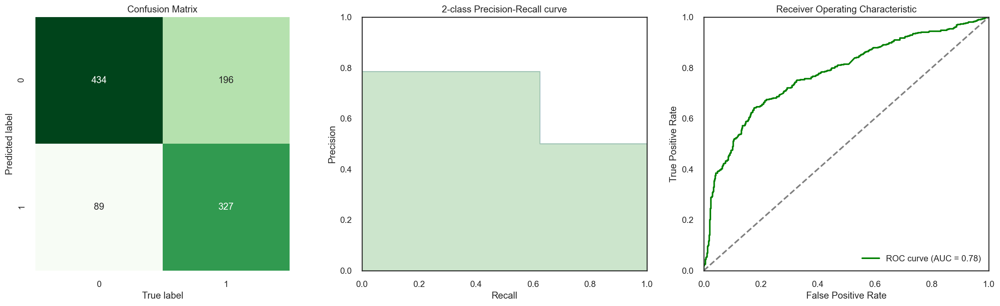

****************
* AdaBoost Log *
****************
Accuracy : 0.7438 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.7466 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7380 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.8052                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


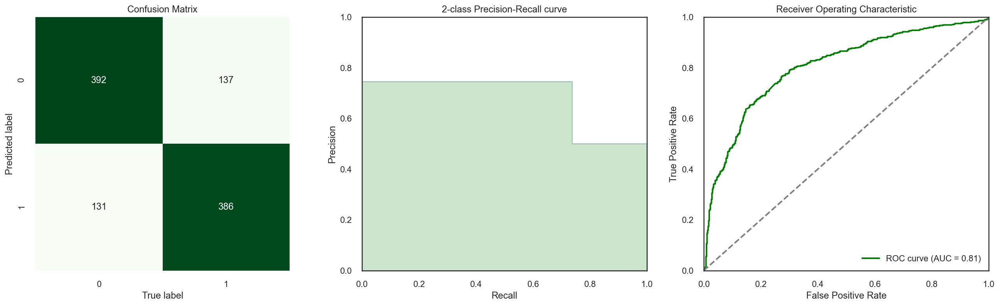

In [435]:
# Keep the results in a dataframe
results6 = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['Logistic Regression Opti',  'AdaBoost Log']
for i, m in enumerate([lg4_opti, Log_AB]):
    print('*' * (len(models[i]) + 4))
    print('* %s *' % models[i])
    print('*' * (len(models[i]) + 4))
    predictions = m.predict(X1_test_scaled)
    probabilities = m.predict_proba(X1_test_scaled)
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y1_test, predictions, probabilities)
    # keep the results
    results6.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}

#### results6

# Voting Ensemble for Classification

Voting ensemble or a majority voting ensemble is an ensemble machine learning model that combines the predictions from multiple other models.
For classification, the predictions for each label are summed and the label with the majority vote is predicted (predictions are the majority vote of contributing models).
A voting ensemble maybe considered a meta-model, a model of models.

In [437]:
# check scikit-learn version
import sklearn
print(sklearn.__version__)
from sklearn.ensemble import VotingClassifier
from numpy import mean
from numpy import std
from sklearn.model_selection import RepeatedStratifiedKFold

0.24.2


## Voting ensemble for 4 models and 8 features - HARD APPROACH

>rf1_tr 0.751 (0.020)
>rf3_opti 0.774 (0.019)
>rf_AB 0.768 (0.019)
>log1_tr 0.741 (0.021)
>lg4_opti 0.740 (0.020)
>Log_AB 0.768 (0.019)
>hard_voting_tr 0.766 (0.019)


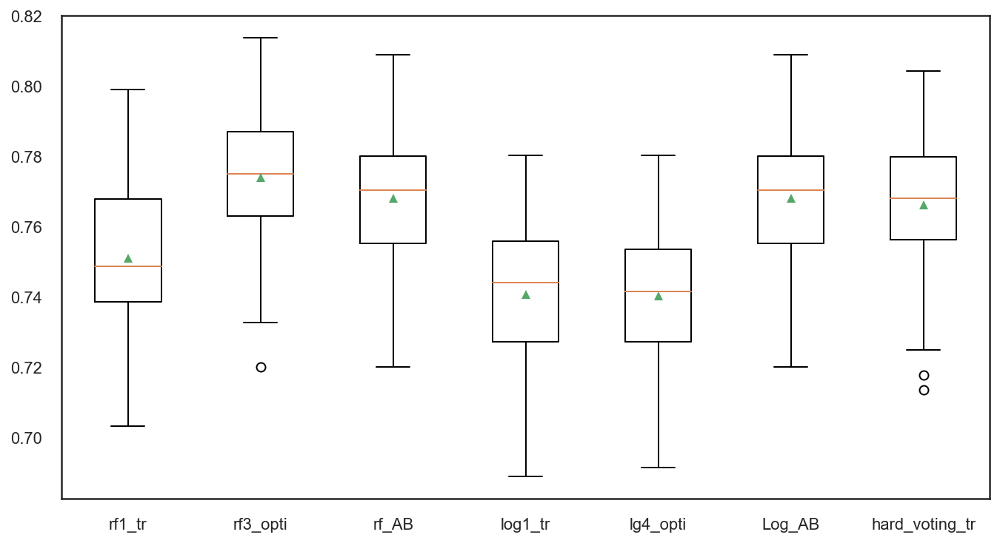

In [438]:
# Get a voting ensemble of models HARD - TRAINING 
def get_voting():
    # define the base models
    models = list()
    models.append(('rf1_tr', RandomForestClassifier()))
    models.append(('rf3_opti', RandomForestClassifier()))
    models.append(('rf_AB', AdaBoostClassifier()))
    
    
    models.append(('log1_tr', LogisticRegression()))  
    models.append(('log4_opti_tr', LogisticRegression()))
    models.append(('Log_AB', AdaBoostClassifier()))
            
    # define the voting ensemble
    ensemble = VotingClassifier(estimators=models, voting='hard')
    return ensemble

# Get a list of models to evaluate
def get_models():
    models = dict()
    
    models['rf1_tr'] = RandomForestClassifier()
    models['rf3_opti'] = RandomForestClassifier(n_estimators= 400, min_samples_split= 5, min_samples_leaf= 5, max_features= 'sqrt', max_depth= 10, bootstrap= True)
    models['rf_AB'] = AdaBoostClassifier()
    
    models['log1_tr'] = LogisticRegression()   
    models['lg4_opti'] = LogisticRegression(C= 0.21148966102391084, penalty='l1', solver= 'liblinear')
    models['Log_AB'] = AdaBoostClassifier() 
    
    models['hard_voting_tr'] = get_voting()    
    return models

# Evaluate a given model using cross-validation: to return a list of scores of 10 repeats of SKFold validations 
def evaluate_model(model, X1_train_scaled, y1_train):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=10, random_state=1)
    scores = cross_val_score(model, X1_train_scaled, y1_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

# get the models to evaluate
models = get_models()

# evaluate the models and store the results. To report the mean performance of each model and create a boxplot to compare distribution of accuracy scores for each one
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X1_train_scaled, y1_train)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance comparison (reports the mean and standard deviation accuracy for each model)

pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

>rf1_tr 0.712 (0.041)
>rf3_opti 0.735 (0.042)
>rf_AB 0.730 (0.042)
>log1_tr 0.722 (0.043)
>lg4_opti 0.721 (0.042)
>Log_AB 0.730 (0.042)
>hard_voting_tr 0.737 (0.043)


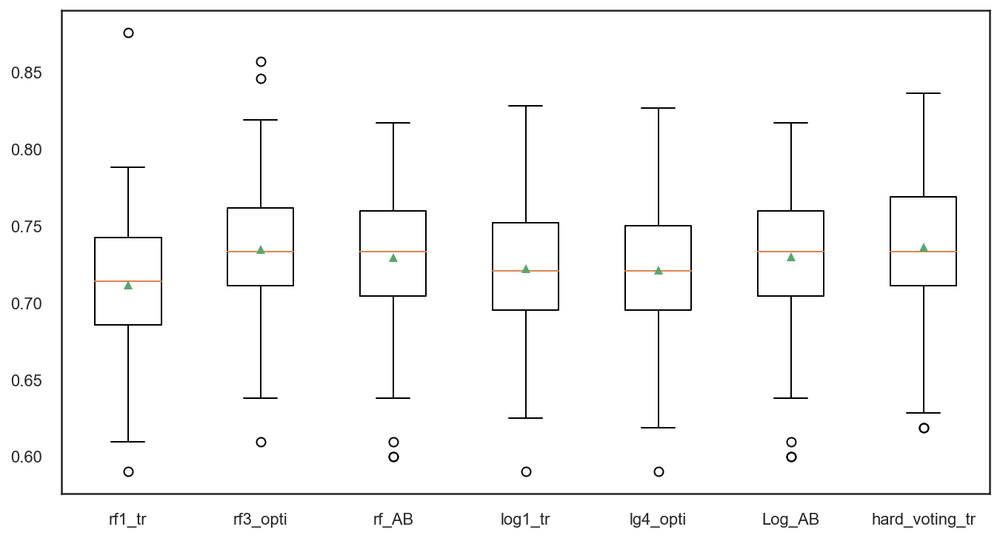

In [441]:
# Get a voting ensemble of models HARD - TEST 
def get_voting():
    models = list()
    models.append(('rf1_tr', RandomForestClassifier()))
    models.append(('rf3_opti', RandomForestClassifier()))
    models.append(('rf_AB', AdaBoostClassifier()))
    
    
    models.append(('log1_tr', LogisticRegression()))  
    models.append(('log4_opti_tr', LogisticRegression()))
    models.append(('Log_AB', AdaBoostClassifier()))
            
    # define the voting ensemble
    ensemble = VotingClassifier(estimators=models, voting='hard')
    return ensemble

# Get a list of models to evaluate
def get_models():
    models = dict()
    
    models['rf1_tr'] = RandomForestClassifier()
    models['rf3_opti'] = RandomForestClassifier(n_estimators= 400, min_samples_split= 5, min_samples_leaf= 5, max_features= 'sqrt', max_depth= 10, bootstrap= True)
    models['rf_AB'] = AdaBoostClassifier()
    
    models['log1_tr'] = LogisticRegression()   
    models['lg4_opti'] = LogisticRegression(C= 0.21148966102391084, penalty='l1', solver= 'liblinear')
    models['Log_AB'] = AdaBoostClassifier() 
    
    models['hard_voting_tr'] = get_voting()    
    return models
        
# Evaluate a given model using cross-validation
def evaluate_model(model, X1_test_scaled, y1_test):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=20, random_state=1)
    scores = cross_val_score(model, X1_test_scaled, y1_test, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

# get the models to evaluate
models = get_models()

# evaluate the models and store the results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X1_test_scaled, y1_test)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()